<font size=7> Phase Lock Histograms

# Setup

In [1]:
from human_hip import spike_data
import numpy as np
from human_hip.spike_data import *
import pickle

import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [5]:
sd = read_autocurated_data( "/workspaces/human_hippocampus/data/ephys/2023-12-03-e-Hc112823_avv9hckcr1/derived/kilosort2/Hc112823_avv9hckcr1_21841_120323_3_acqm.zip" )

with open( "2023-12-03-e-Hc112823_avv9hckcr1_acid1_theta_spike_locking_s.pkl", 'rb') as file:
    data = pickle.load(file)
angles = data["mean_angle"]
pvals = data["rayleigh_p"]


In [55]:
neuron_x = []
neuron_y = []
neuron_xy = []
for key,val in sd.neuron_data[0].items():
    neuron_x.append( val["position"][0] )
    neuron_y.append( val["position"][1] )
    neuron_xy.append( val["position"] )
neuron_x = np.array(neuron_x)
neuron_y = np.array(neuron_y)

/tmp/ipykernel_22450/283558322.py:4: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


In [7]:
sig_x = neuron_x[pvals<0.05]
sig_y = neuron_y[pvals<0.05]
sig_angles =angles[pvals<0.05]
sig_xy = np.array( [ [sig_x[i], sig_y[i]] for i in range(len(sig_x)) ] )

# Get Unique

In [71]:
unique_pairs, unique_indices = np.unique(sig_xy, axis=0, return_index=True)

In [74]:
sig_x = sig_x[ unique_indices ]
sig_y = sig_y[ unique_indices ]
sig_angles = sig_angles[ unique_indices ]

# Plots

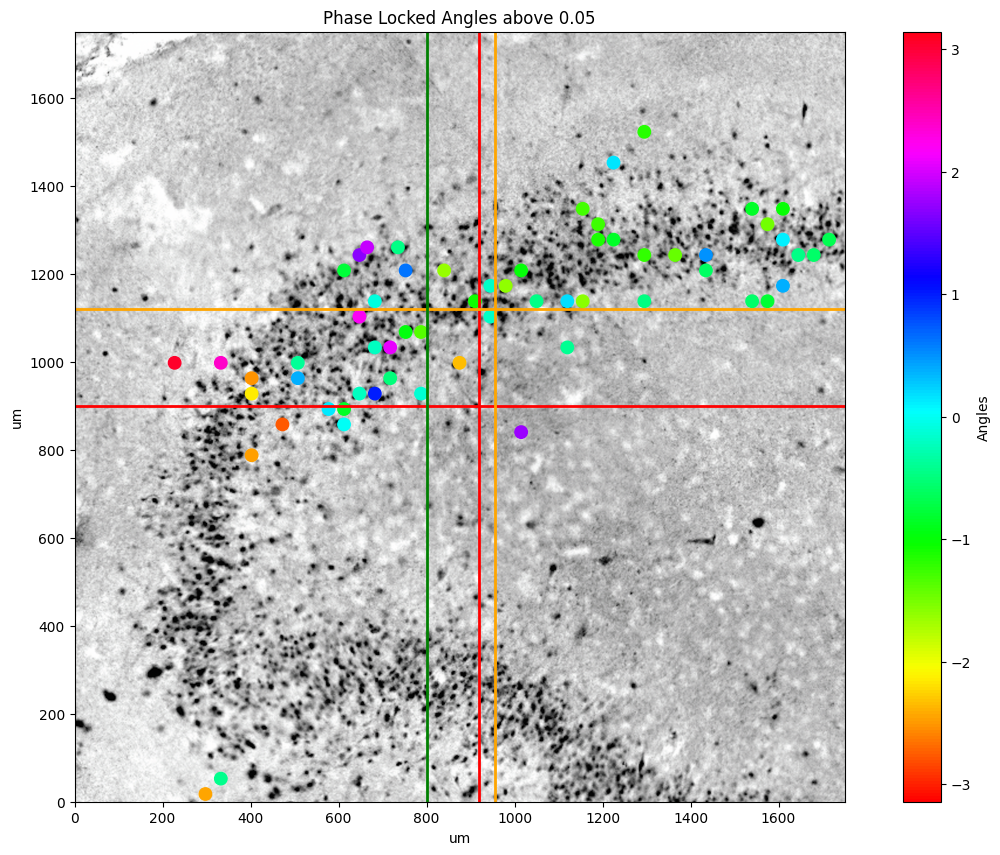

In [75]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x, sig_y, c=sig_angles, cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles


plt.vlines( 920, 0, 1750, color="red", linewidth=2 )

plt.hlines( 900, 0, 1750, color="red", linewidth=2 )



plt.hlines( 1120, 0, 1750, color="orange", linewidth=2 )
plt.vlines( 955, 0, 1750, color="orange", linewidth=2 )

plt.vlines( 800, 0, 1750, color="green", linewidth=2 )

In [76]:
g1 = np.logical_or( np.logical_or( sig_x<940, np.logical_and(sig_x==945,sig_y<1120) ) , np.logical_and(sig_x>900,sig_y<900) )

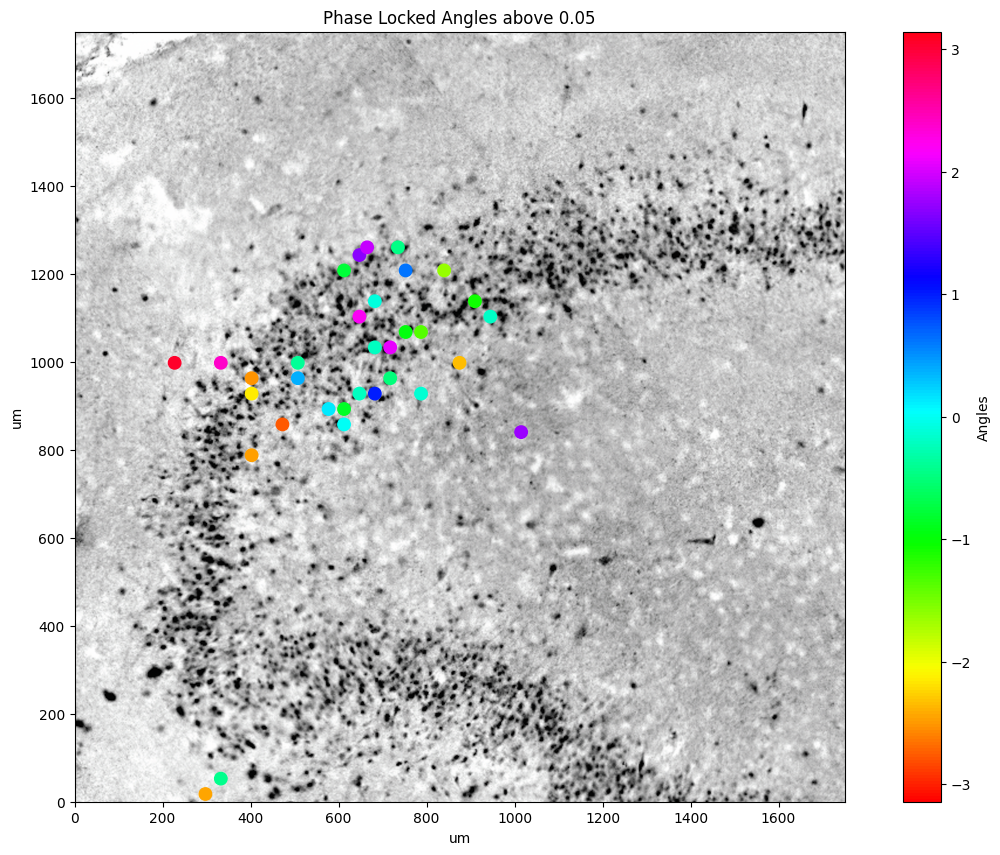

In [77]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x[g1], sig_y[g1], c=sig_angles[g1], cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles


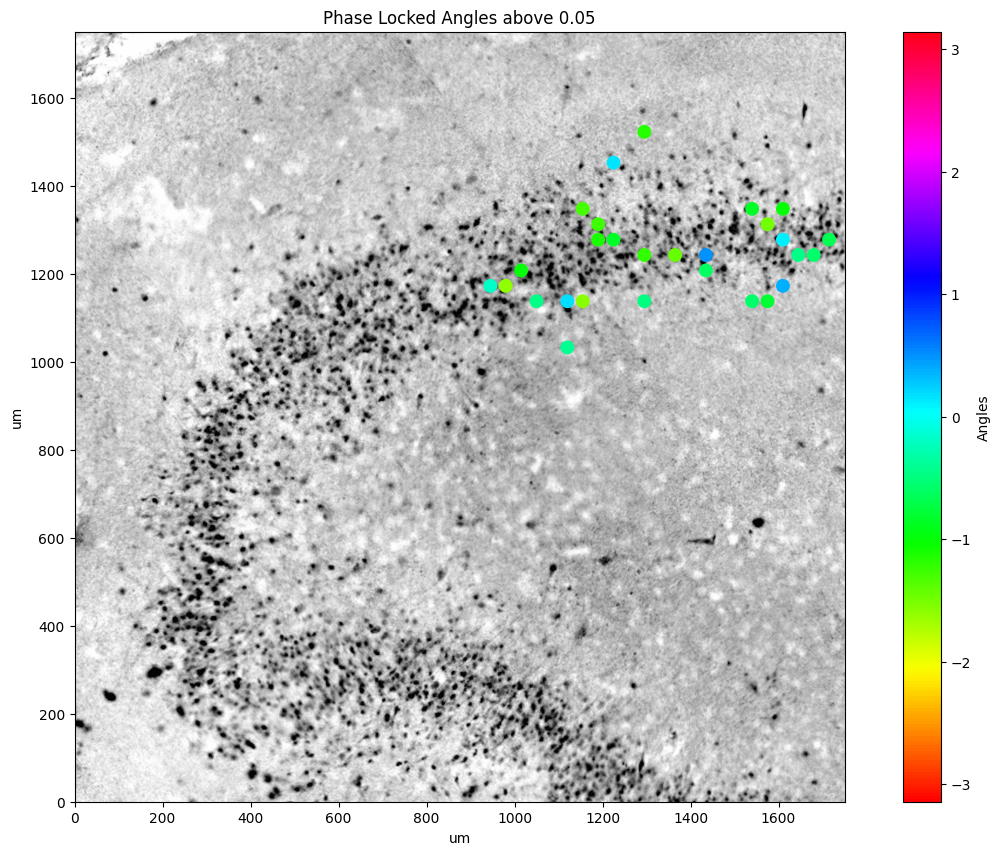

In [78]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x[np.logical_not(g1)], sig_y[np.logical_not(g1)], c=sig_angles[np.logical_not(g1)], cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles


# histograms

In [79]:
group1 = sig_angles[g1]
group2 = sig_angles[np.logical_not(g1)]


# group1 = sig_angles[sig_x<800]
# group2 = sig_angles[sig_x>800]

In [80]:
sig_angles

array([ 3.05372597, -2.43801175, -0.42060538,  2.3838609 , -2.45985158,
       -2.15904573, -2.50545998, -2.75066294,  0.3871067 , -0.38171144,
        0.13693006,  0.02250094, -0.85519784, -0.76636619, -0.20591096,
        2.19186045,  1.67958351,  1.9347846 ,  0.99222923, -0.19730562,
       -0.08389366, -0.51150016,  2.07747831, -0.45318676, -0.97889233,
        0.61833662, -0.13503766, -1.37121147, -1.63128297, -2.34639021,
       -1.07939009, -0.1813359 , -0.19035953, -1.60198718,  1.74930867,
       -1.00307738, -0.45891528, -0.39665863,  0.18989834, -1.58087113,
       -1.29757183, -1.10618281, -1.26132011, -0.85263299,  0.16971901,
       -0.46784712, -1.21954437, -1.15761953, -1.44221733, -0.60893041,
        0.50953354, -0.5791103 , -0.8389006 , -0.807068  , -1.49241047,
        0.38217018,  0.11234423, -1.02352642, -0.45456199, -0.56640169,
       -0.68644192])

(array([5., 2., 2., 5., 9., 2., 1., 2., 4., 1.]),
 array([-2.75066294, -2.17022405, -1.58978516, -1.00934627, -0.42890738,
         0.15153151,  0.7319704 ,  1.31240929,  1.89284818,  2.47328707,
         3.05372597]),
 <BarContainer object of 10 artists>)

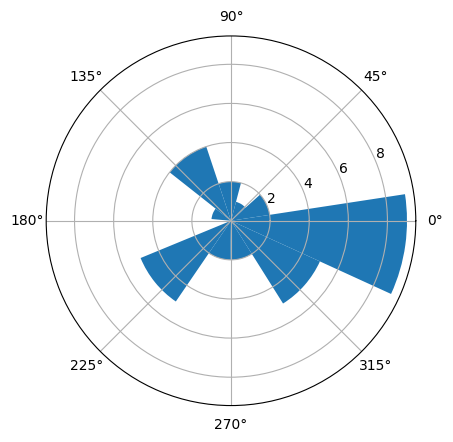

In [88]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.hist(group1,  density=False) #bins=4/

(array([9., 9., 5., 5.]),
 array([-1.60198718, -1.074107  , -0.54622682, -0.01834664,  0.50953354]),
 <BarContainer object of 4 artists>)

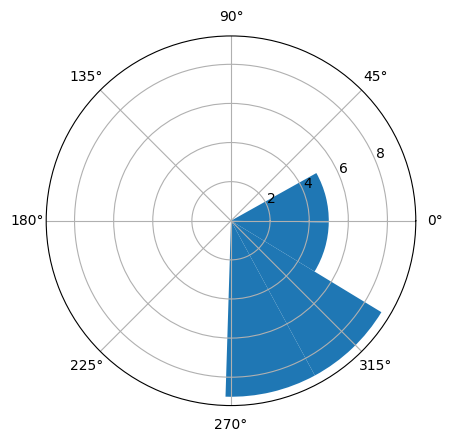

In [91]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.hist(group2, bins=4,  density=False) #

(array([3., 0., 0., 3., 0., 0., 3., 0., 0., 3.]),
 array([-1.3 , -1.22, -1.14, -1.06, -0.98, -0.9 , -0.82, -0.74, -0.66,
        -0.58, -0.5 ]),
 <BarContainer object of 10 artists>)

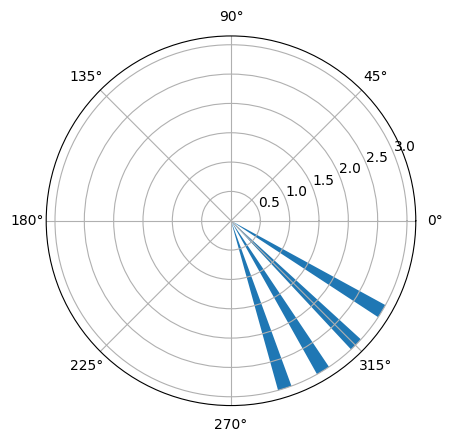

In [140]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.hist([-.8,-.8,-.8, -1,-1,-1, -.5,-.5,-.5, -1.3, -1.3, -1.3],  density=False) #bins=4/

(array([ 5.,  3., 11., 16., 12.,  6.,  1.,  2.,  4.,  1.]),
 array([-2.75066294, -2.17022405, -1.58978516, -1.00934627, -0.42890738,
         0.15153151,  0.7319704 ,  1.31240929,  1.89284818,  2.47328707,
         3.05372597]),
 <BarContainer object of 10 artists>)

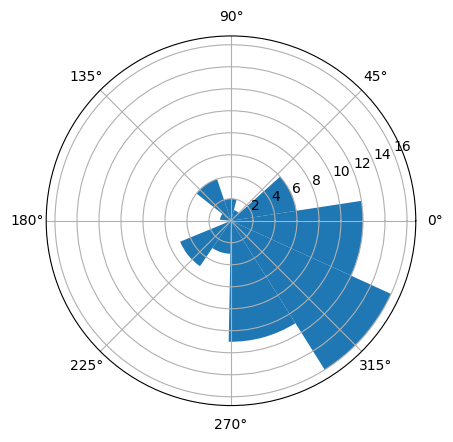

In [137]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.hist(sig_angles,  density=False) #bins=4/

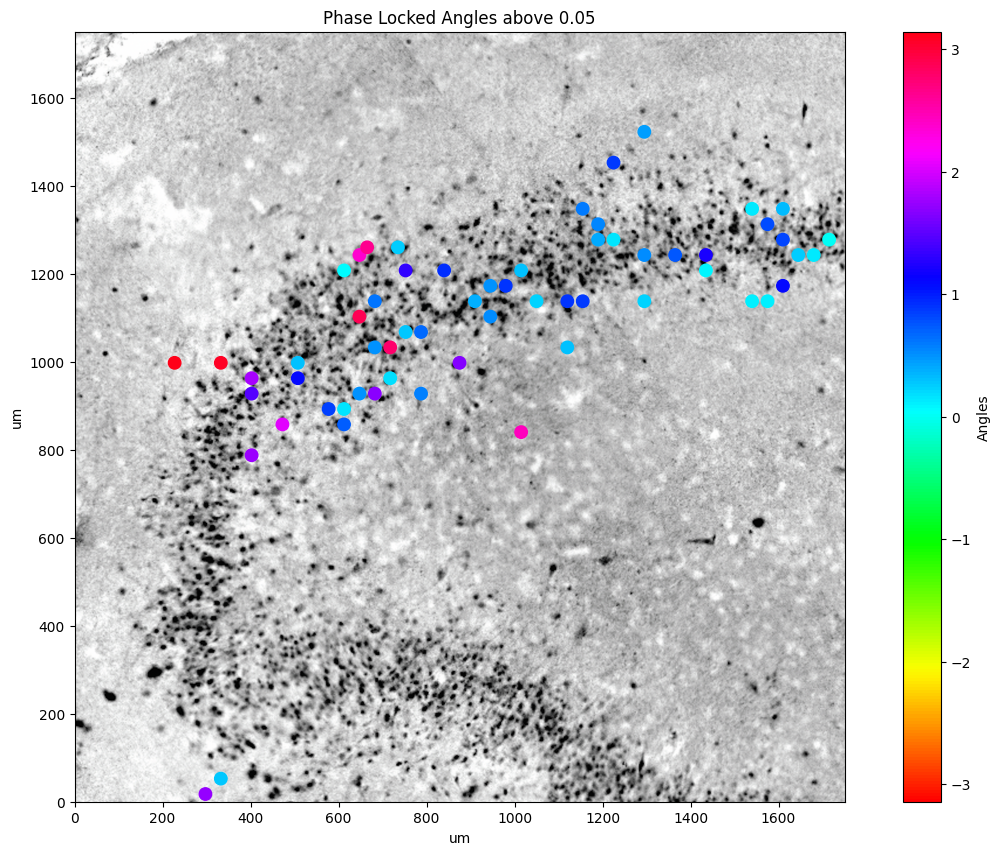

In [97]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x, sig_y, c=np.abs(sig_angles+.7), cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles


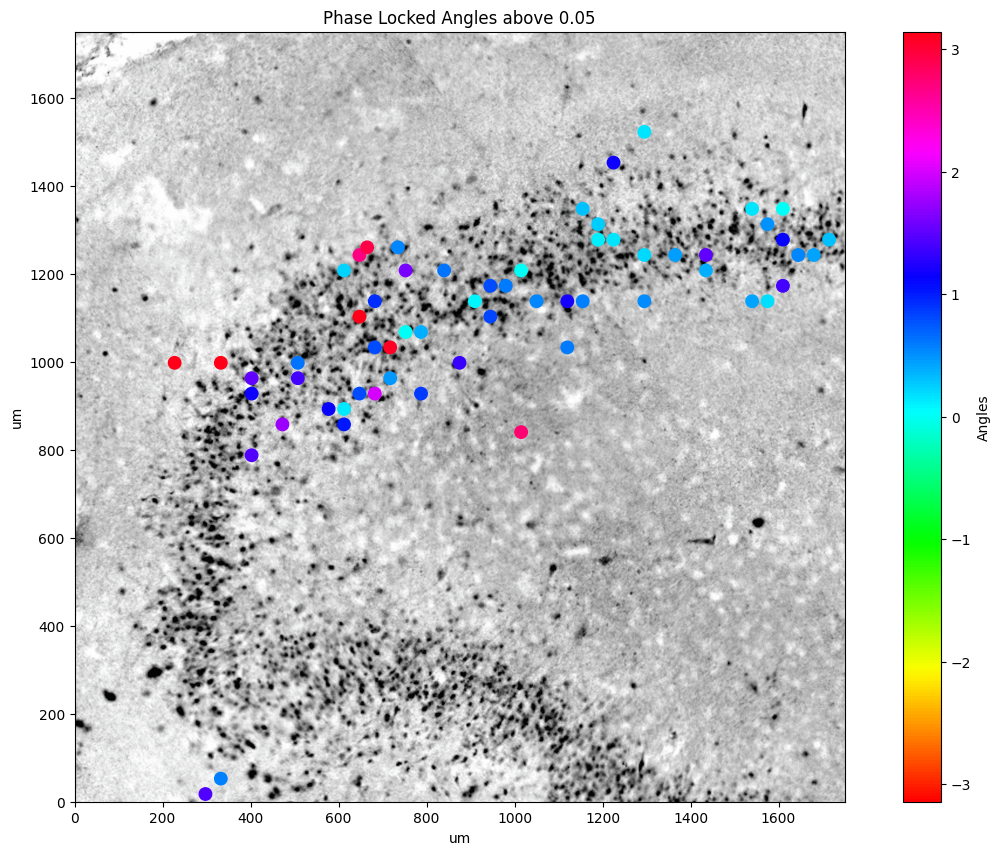

In [99]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x, sig_y, c=np.abs(sig_angles+1), cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles


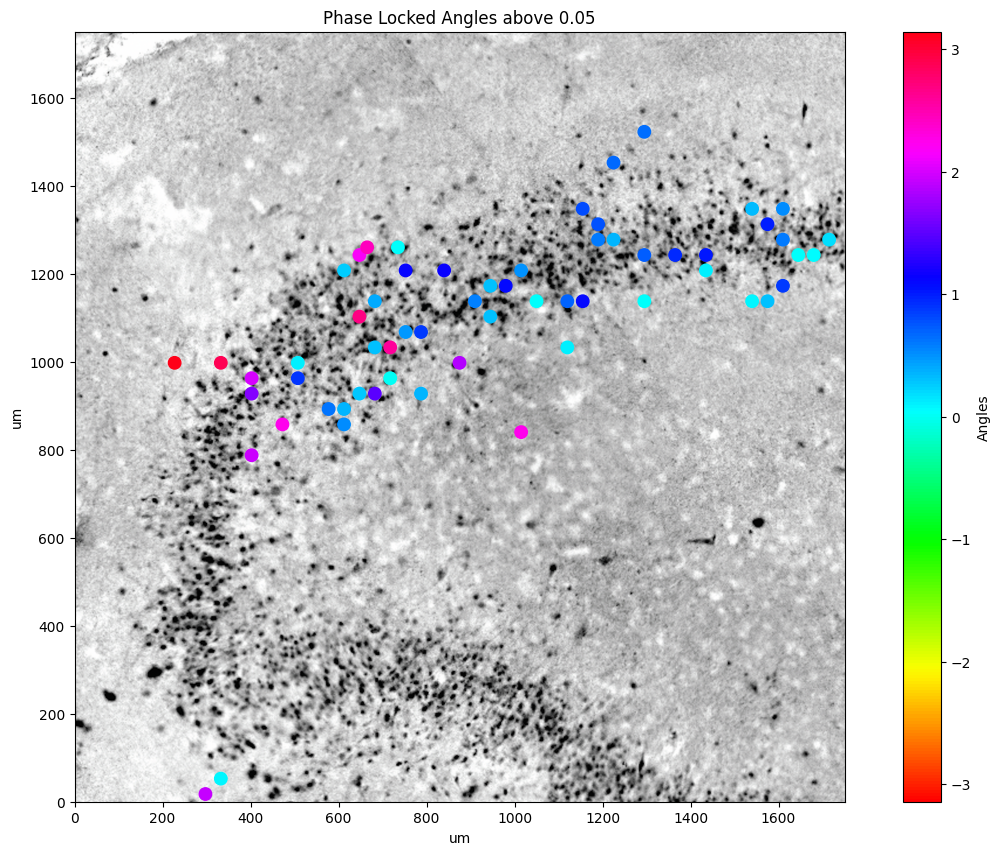

In [124]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x, sig_y, c=np.abs(sig_angles+.5), cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles

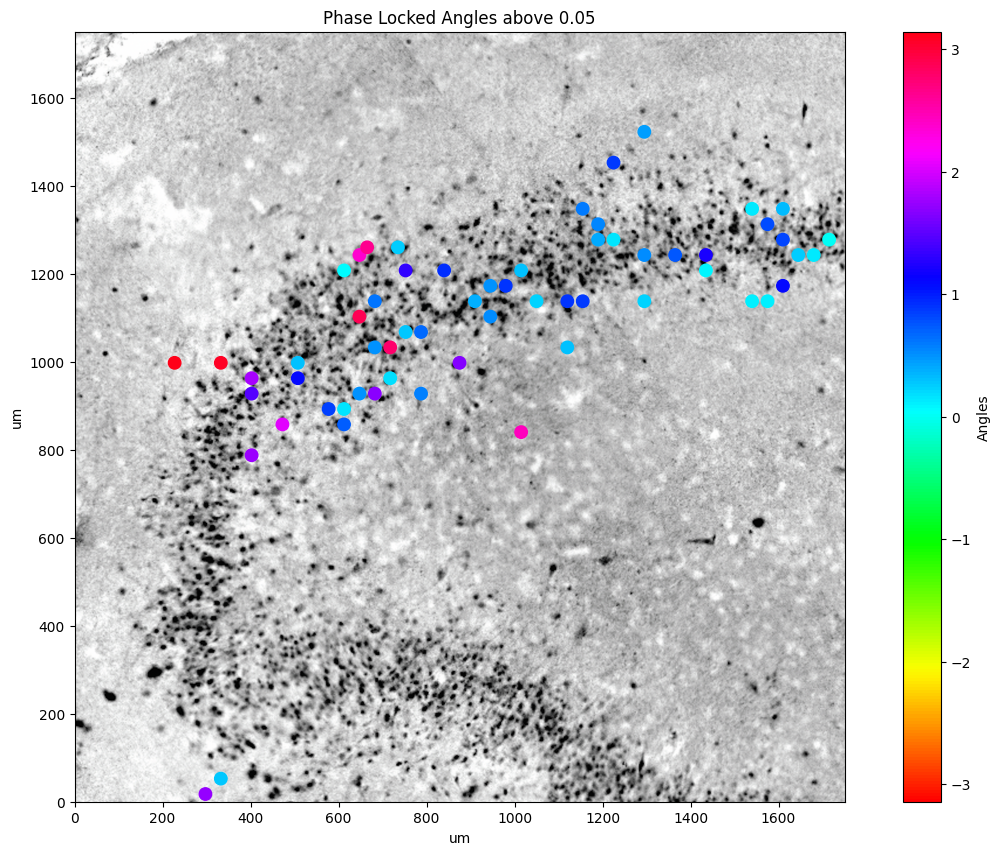

In [125]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter( sig_x, sig_y, c=np.abs(sig_angles+.7), cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles

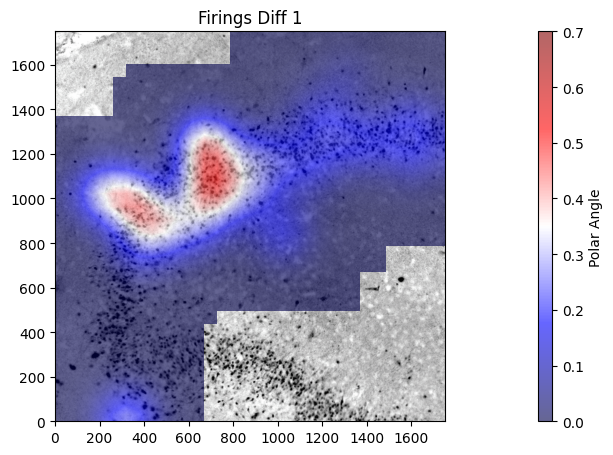

In [121]:
from matplotlib.colors import LinearSegmentedColormap
#cmap =   #LinearSegmentedColormap.from_list("my_cmap", ['white', 'red' ])

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter

img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")

fr = np.abs(sig_angles+.5)

mean1 = np.mean(fr)
std1 = np.std(fr)


# Determine global min and max for the colorbar
# global_min = np.min(fr) #np.mean(fr)-2*np.std(fr) 
# global_max = np.max(fr) #np.mean(fr)+2*np.std(fr) 
global_min = np.mean(fr)-np.std(fr) 
global_max = np.mean(fr)+np.std(fr) 


# Normalize both datasets based on the global min and max
#norm = plt.Normalize( vmin= np.mean(fr)-np.std(fr), vmax= np.mean(fr)+np.std(fr) )
norm = plt.Normalize( vmin= 0, vmax= .7)
#plt.figure(figsize=(1, 6))

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05])

plt.imshow(img, extent=[0, 3850, 0, 2100])
heatmap1, xedges1, yedges1 = np.histogram2d(sig_x, sig_y, bins=30, weights=fr, range=[[0, 1750], [0, 1750]])
heatmap1 = gaussian_filter(heatmap1, sigma=1.6)
heatmap1 = np.ma.masked_where(heatmap1 == 0, heatmap1)
im1 = plt.imshow(heatmap1.T, extent=[0, 1750, 0, 1750], origin='lower', cmap="seismic", norm=norm, alpha=0.6, interpolation='bilinear')
plt.title('Firings Diff 1')

#cbar_ax = plt.subplot(gs[2])
#cbar = plt.colorbar(im2, cax=cbar_ax)
#cbar.set_label('Firing Differences')

cbar_ax = plt.subplot(gs[0, 2])  # Add the colorbar to the third column in the grid
cbar = plt.colorbar(im1, cax=cbar_ax)  # Create the colorbar based on the heatmap
cbar.set_label('Polar Angle')

plt.tight_layout()
plt.show()

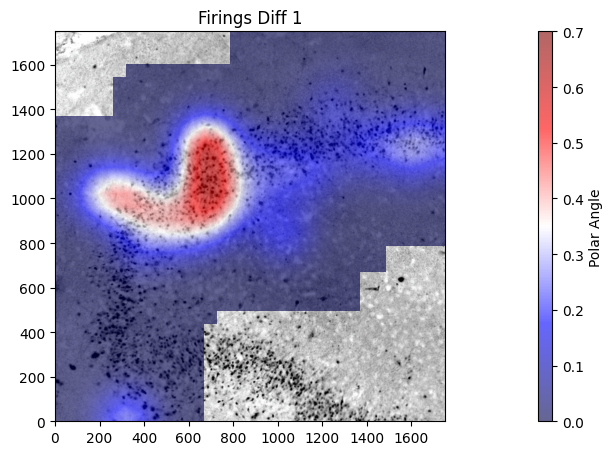

In [122]:
from matplotlib.colors import LinearSegmentedColormap
#cmap =   #LinearSegmentedColormap.from_list("my_cmap", ['white', 'red' ])

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter

img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")

fr = np.abs(sig_angles+1)

mean1 = np.mean(fr)
std1 = np.std(fr)


# Determine global min and max for the colorbar
# global_min = np.min(fr) #np.mean(fr)-2*np.std(fr) 
# global_max = np.max(fr) #np.mean(fr)+2*np.std(fr) 
global_min = np.mean(fr)-np.std(fr) 
global_max = np.mean(fr)+np.std(fr) 


# Normalize both datasets based on the global min and max
#norm = plt.Normalize( vmin= np.mean(fr)-np.std(fr), vmax= np.mean(fr)+np.std(fr) )
norm = plt.Normalize( vmin= 0, vmax= .7)
#plt.figure(figsize=(1, 6))

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05])

plt.imshow(img, extent=[0, 3850, 0, 2100])
heatmap1, xedges1, yedges1 = np.histogram2d(sig_x, sig_y, bins=30, weights=fr, range=[[0, 1750], [0, 1750]])
heatmap1 = gaussian_filter(heatmap1, sigma=1.6)
heatmap1 = np.ma.masked_where(heatmap1 == 0, heatmap1)
im1 = plt.imshow(heatmap1.T, extent=[0, 1750, 0, 1750], origin='lower', cmap="seismic", norm=norm, alpha=0.6, interpolation='bilinear')
plt.title('Firings Diff 1')

#cbar_ax = plt.subplot(gs[2])
#cbar = plt.colorbar(im2, cax=cbar_ax)
#cbar.set_label('Firing Differences')

cbar_ax = plt.subplot(gs[0, 2])  # Add the colorbar to the third column in the grid
cbar = plt.colorbar(im1, cax=cbar_ax)  # Create the colorbar based on the heatmap
cbar.set_label('Polar Angle')

plt.tight_layout()
plt.show()

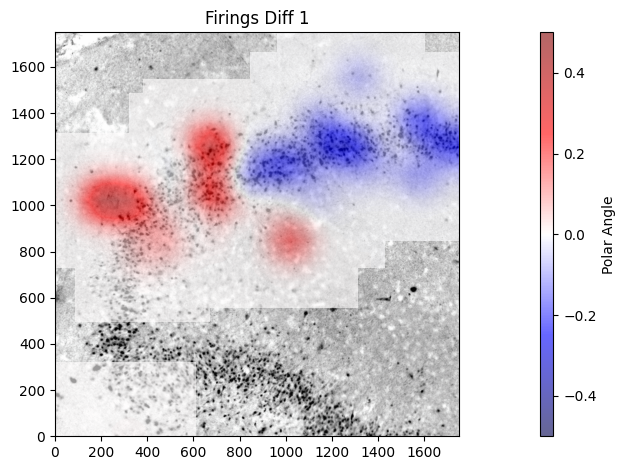

In [142]:
from matplotlib.colors import LinearSegmentedColormap
#cmap =   #LinearSegmentedColormap.from_list("my_cmap", ['white', 'red' ])

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter

img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")

fr = np.abs(sig_angles+1) - np.mean(np.abs(sig_angles+1))

mean1 = np.mean(fr)
std1 = np.std(fr)


# Determine global min and max for the colorbar
# global_min = np.min(fr) #np.mean(fr)-2*np.std(fr) 
# global_max = np.max(fr) #np.mean(fr)+2*np.std(fr) 
global_min = np.mean(fr)-np.std(fr) 
global_max = np.mean(fr)+np.std(fr) 


# Normalize both datasets based on the global min and max
#norm = plt.Normalize( vmin= np.mean(fr)-np.std(fr), vmax= np.mean(fr)+np.std(fr) )
norm = plt.Normalize( vmin= -.5, vmax= .5)
#plt.figure(figsize=(1, 6))

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05])

plt.imshow(img, extent=[0, 3850, 0, 2100])
heatmap1, xedges1, yedges1 = np.histogram2d(sig_x, sig_y, bins=30, weights=fr, range=[[0, 1750], [0, 1750]])
heatmap1 = gaussian_filter(heatmap1, sigma=1.2)
heatmap1 = np.ma.masked_where(heatmap1 == 0, heatmap1)
im1 = plt.imshow(heatmap1.T, extent=[0, 1750, 0, 1750], origin='lower', cmap="seismic", norm=norm, alpha=0.6, interpolation='bilinear')
plt.title('Firings Diff 1')

#cbar_ax = plt.subplot(gs[2])
#cbar = plt.colorbar(im2, cax=cbar_ax)
#cbar.set_label('Firing Differences')

cbar_ax = plt.subplot(gs[0, 2])  # Add the colorbar to the third column in the grid
cbar = plt.colorbar(im1, cax=cbar_ax)  # Create the colorbar based on the heatmap
cbar.set_label('Polar Angle')

plt.tight_layout()
plt.show()

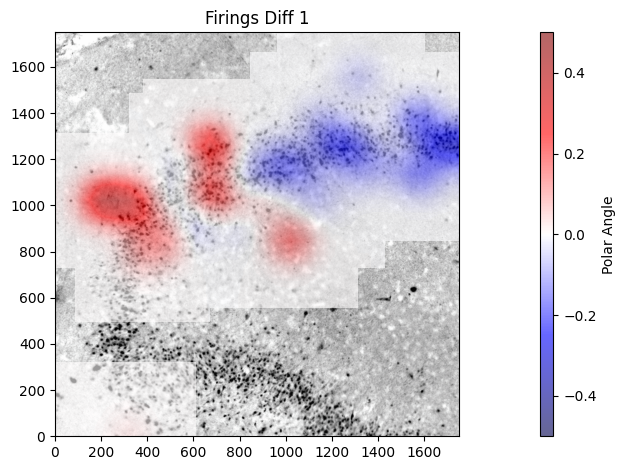

In [139]:
from matplotlib.colors import LinearSegmentedColormap
#cmap =   #LinearSegmentedColormap.from_list("my_cmap", ['white', 'red' ])

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from scipy.ndimage import gaussian_filter

img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")

fr = np.abs(sig_angles+.8) - np.mean(np.abs(sig_angles+.8))

mean1 = np.mean(fr)
std1 = np.std(fr)


# Determine global min and max for the colorbar
# global_min = np.min(fr) #np.mean(fr)-2*np.std(fr) 
# global_max = np.max(fr) #np.mean(fr)+2*np.std(fr) 
global_min = np.mean(fr)-np.std(fr) 
global_max = np.mean(fr)+np.std(fr) 


# Normalize both datasets based on the global min and max
#norm = plt.Normalize( vmin= np.mean(fr)-np.std(fr), vmax= np.mean(fr)+np.std(fr) )
norm = plt.Normalize( vmin= -.5, vmax= .5)
#plt.figure(figsize=(1, 6))

gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05])

plt.imshow(img, extent=[0, 3850, 0, 2100])
heatmap1, xedges1, yedges1 = np.histogram2d(sig_x, sig_y, bins=30, weights=fr, range=[[0, 1750], [0, 1750]])
heatmap1 = gaussian_filter(heatmap1, sigma=1.2)
heatmap1 = np.ma.masked_where(heatmap1 == 0, heatmap1)
im1 = plt.imshow(heatmap1.T, extent=[0, 1750, 0, 1750], origin='lower', cmap="seismic", norm=norm, alpha=0.6, interpolation='bilinear')
plt.title('Firings Diff 1')

#cbar_ax = plt.subplot(gs[2])
#cbar = plt.colorbar(im2, cax=cbar_ax)
#cbar.set_label('Firing Differences')

cbar_ax = plt.subplot(gs[0, 2])  # Add the colorbar to the third column in the grid
cbar = plt.colorbar(im1, cax=cbar_ax)  # Create the colorbar based on the heatmap
cbar.set_label('Polar Angle')

plt.tight_layout()
plt.show()